# Task 2: Clustering

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import cm
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances

## Loading the Customer Profile model

In [2]:
customer_profile = pd.read_csv('dataset\\customer_profile_model.csv', sep='\t', index_col=0)
customer_profile

,I,Iu,Imax,E,Savg,R,F,M
CustomerID,,,,,,,,
12347.0,3.330211,1.939519,2.829947,4.239118,2.777935,40,0.778151,3.556087
12348.0,3.035029,0.954243,2.778151,2.550341,2.417438,76,0.477121,2.894560
12349.0,2.799341,1.857332,2.799341,3.903268,3.163623,19,0.000000,3.163623
12350.0,2.292256,1.204120,2.292256,2.500000,2.468938,311,0.000000,2.468938
12352.0,2.665581,1.755875,2.096910,3.158366,2.324080,73,0.778151,3.102231
...,...,...,...,...,...,...,...,...
18280.0,1.653213,1.000000,1.653213,1.846439,2.256718,160,0.000000,2.256718
18281.0,1.732394,0.845098,1.732394,1.842371,1.907519,4,0.000000,1.907519
18282.0,1.991226,1.079181,1.845098,3.022055,1.945961,216,0.301030,2.246991


In [3]:
customer_profile.drop('R', axis=1, inplace=True)

## Standardization \& Dimensionality Reduction

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

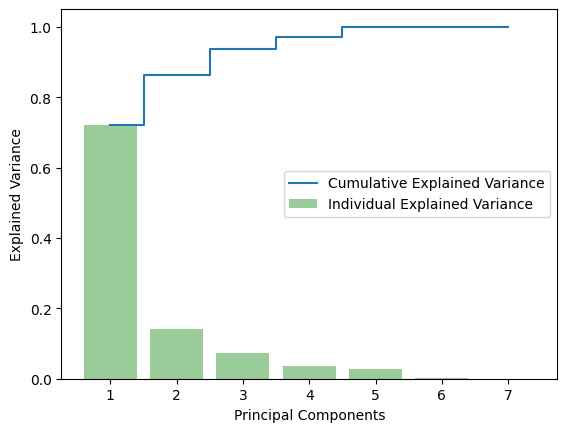

In [5]:
scaler = StandardScaler()
std_customer_profile = scaler.fit_transform(customer_profile)

pca = PCA()
pca.fit(std_customer_profile)

plt.step(range(1, customer_profile.shape[1] + 1), pca.explained_variance_ratio_.cumsum(), 
         where='mid', label='Cumulative Explained Variance')
plt.bar(range(1, customer_profile.shape[1] + 1), pca.explained_variance_ratio_, 
        alpha=0.4, color='g', label='Individual Explained Variance')

plt.ylabel('Explained Variance')
plt.xlabel('Principal Components')
plt.legend(loc='center right');

plt.savefig('tex\\img\\clustering\\pca.png')

The graph shows the amount of variance captured depending on the number of components we include. A rule of thumb is to preserve around 80% of the variance. So, in this instance, we decide to keep 2 components.

In [6]:
pca = PCA(n_components=2)
pca_customer_profile = pca.fit_transform(std_customer_profile)

## K-Means

In [7]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

In [8]:
def plot_silhouette_score(df, labels):
    cluster_labels = np.unique(labels)
    n_clusters = cluster_labels.shape[0]
    
    silhouette_vals = silhouette_samples(df, labels)

    y_ax_lower, y_ax_upper = 0, 0
    y_tick = []

    for i, c in enumerate(cluster_labels):
    
        c_silhouette_vals = silhouette_vals[labels == c]
        c_silhouette_vals.sort()
    
        print('Cluster', c, 'avg silhouette:', np.mean(c_silhouette_vals))
    
        y_ax_upper += len(c_silhouette_vals)
        color = cm.jet(float(i)/n_clusters)
        plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0, edgecolor='none', color=color)
        y_tick.append((y_ax_lower + y_ax_upper) / 2.)
        y_ax_lower += len(c_silhouette_vals)

    silhouette_avg = np.mean(silhouette_vals)
    print('Total avg silhouette:', silhouette_avg)
    plt.axvline(silhouette_avg, color='red', linestyle='--')
    plt.yticks=(y_tick, cluster_labels + 1)
    plt.ylabel('Points')
    plt.xlabel('Silhouette')
    plt.tight_layout()

In [9]:
def plot_similarity_heatmap(df, labels):
    df = pd.DataFrame(df)
    df['cluster'] = labels
    columns = df.columns[0:-1]
    df.sort_values(by='cluster', ascending=False, inplace=True)
    dist = euclidean_distances(df.loc[:, columns], df.loc[:, columns])
    sim = np.exp(-dist)
    fig, ax = plt.subplots(figsize=(7,5))
    sns.heatmap(sim, ax=ax)

In [10]:
def plot_basic_statistics(df, labels, columns):
    df = pd.DataFrame(df, columns=columns)
    df['cluster'] = labels
    columns = df.columns[0:-1]     
    means = []
    std = []
    for i in np.unique(df['cluster'].array):
        clust = df.loc[df['cluster'] == i, columns]
        means.append(clust.describe().loc['mean'].values)
        std.append(clust.describe().loc['std'].values)  
    legend = []
    for i in np.unique(df['cluster'].array):
        plt.plot(range(0, columns.shape[0]), means[i], marker='o')
        legend.append('Cluster %d' %i)
    plt.legend(legend)
    plt.xticks(range(0, columns.shape[0]), columns)

In [11]:
elbow = dict()
silhouette = dict()
for k in range(2, 15):
    kmeans = KMeans(init='k-means++', n_clusters=k)
    clusters = kmeans.fit_predict(pca_customer_profile)
    elbow[k] = kmeans.inertia_
    silhouette[k] = silhouette_score(pca_customer_profile, clusters)

C:\Users\akila\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\akila\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\akila\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\U

The elbow method only uses intra-cluster distances while the silhouette method uses a combination of inter- and intra-cluster distances. So, we can expect that they end up with different results.

### Silhouette method

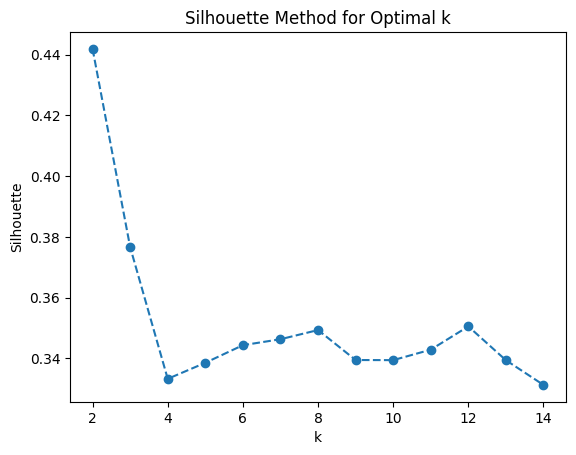

In [12]:
plt.plot(*zip(*silhouette.items()), marker='o', linestyle='--')
plt.title('Silhouette Method for Optimal k')
plt.ylabel('Silhouette')
plt.xlabel('k');

plt.savefig('tex\\img\\clustering\\sil.png')

In [13]:
print('The best (k, silhouette score) is:', max(silhouette.items(), key=lambda t: t[1]))

The best (k, silhouette score) is: (2, 0.44188907896675694)


In [14]:
kmeans = KMeans(init='k-means++', n_clusters=2)
clusters_customers = kmeans.fit_predict(pca_customer_profile)

C:\Users\akila\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0 avg silhouette: 0.4254984353287333
Cluster 1 avg silhouette: 0.4596862609725275
Total avg silhouette: 0.44188907896675694


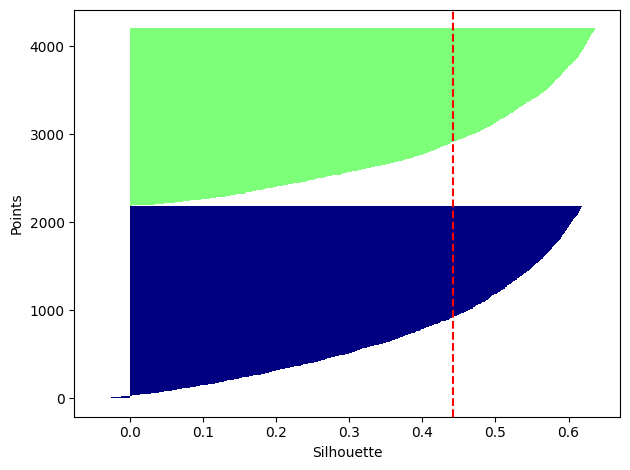

In [15]:
plot_silhouette_score(pca_customer_profile, clusters_customers)

plt.savefig('tex\\img\\clustering\\sil_tot_2.png')

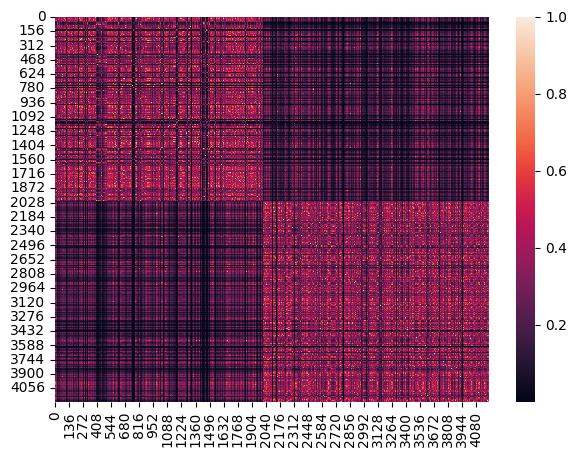

In [16]:
plot_similarity_heatmap(customer_profile, clusters_customers)

plt.savefig('tex\\img\\clustering\\sim_heatmap_2.png')

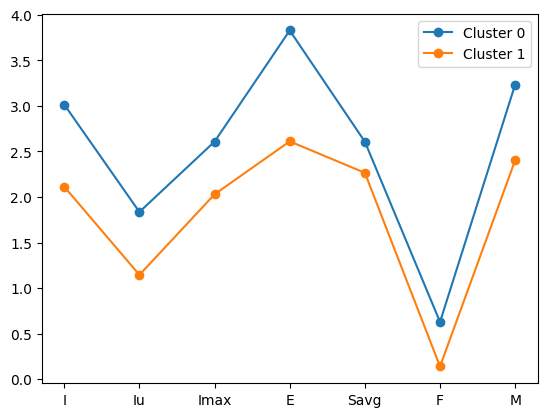

In [17]:
plot_basic_statistics(customer_profile, clusters_customers, customer_profile.columns)

plt.savefig('tex\\img\\clustering\\cluster_avg_2.png')

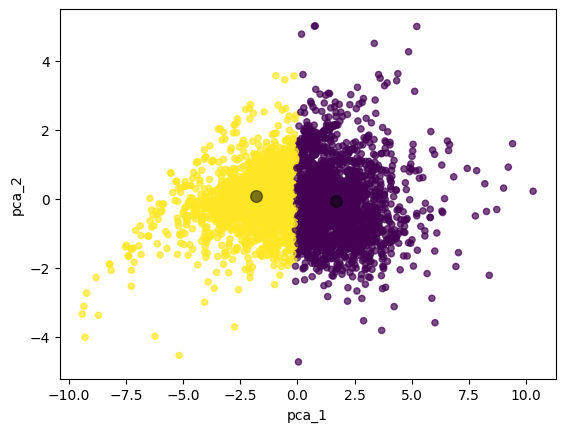

In [18]:
plt.scatter(*pca_customer_profile.T, c=clusters_customers, s=20, alpha=0.7)
# select cluster centers
centroids = kmeans.cluster_centers_
plt.xlabel('pca_1')
plt.ylabel('pca_2')
plt.scatter(*centroids.T, c='black', s=70, alpha=0.5);

plt.savefig('tex\\img\\clustering\\km_clusters.png')

In [19]:
pd.DataFrame(pd.Series(clusters_customers).value_counts(), columns=['CustomersNb']).T.sort_index(axis=1)

,0,1
CustomersNb,2189,2016


For comparison, if we run the K-Means algorithm without the PCA step, the result would be the following:

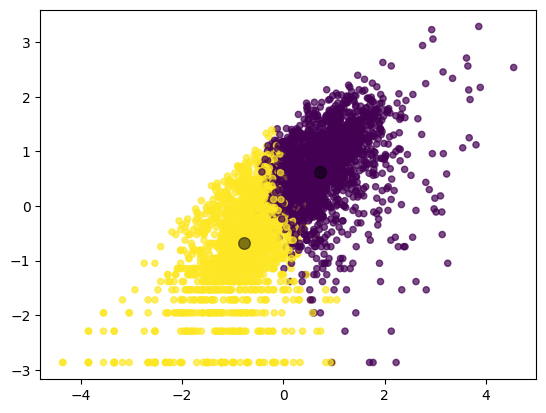

In [20]:
plt.scatter(std_customer_profile[:, 0], std_customer_profile[:, 1], c=clusters_customers, s=20, alpha=0.7)
# select cluster centers
centroids = pca.inverse_transform(kmeans.cluster_centers_)
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=70, alpha=0.5);

### Elbow method

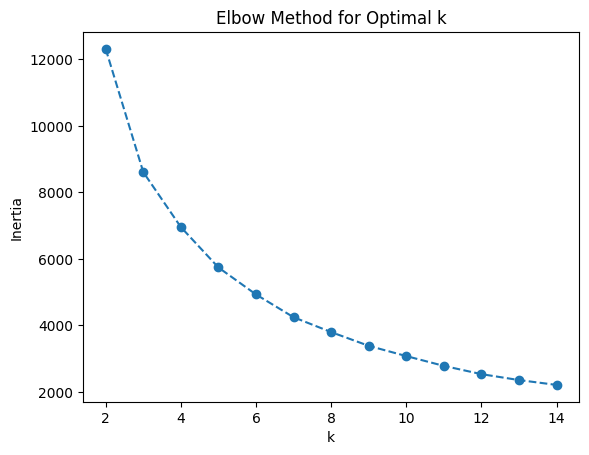

In [21]:
plt.plot(*zip(*elbow.items()), marker='o', linestyle='--')
plt.title('Elbow Method for Optimal k')
plt.ylabel('Inertia')
plt.xlabel('k');

plt.savefig('tex\\img\\clustering\\sse.png')

In [22]:
print('The silhouette score for k = 3 is:', silhouette[3])

The silhouette score for k = 3 is: 0.3766548359173613


In [23]:
kmeans = KMeans(init='k-means++', n_clusters=3)
clusters_customers = kmeans.fit_predict(pca_customer_profile)

C:\Users\akila\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0 avg silhouette: 0.38197829616452955
Cluster 1 avg silhouette: 0.41124315786888327
Cluster 2 avg silhouette: 0.3575011588100477
Total avg silhouette: 0.3766329798342325


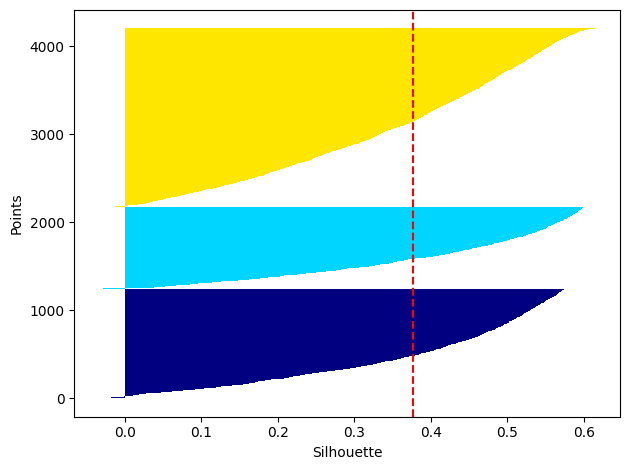

In [24]:
plot_silhouette_score(pca_customer_profile, clusters_customers)

plt.savefig('tex\\img\\clustering\\sil_tot.png')

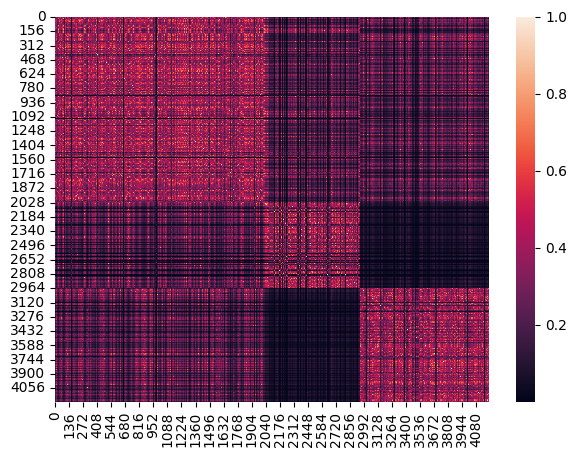

In [25]:
plot_similarity_heatmap(customer_profile, clusters_customers)

plt.savefig('tex/img/clustering/sim_heatmap.png')

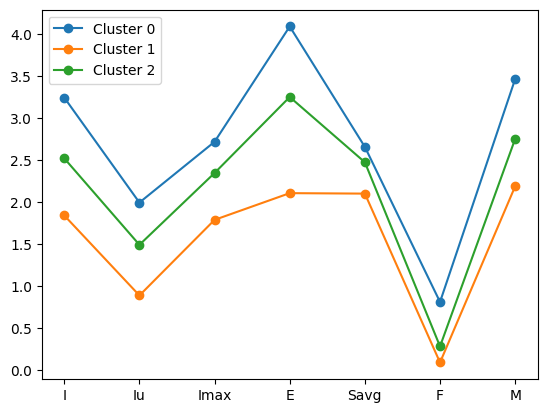

In [26]:
plot_basic_statistics(customer_profile, clusters_customers, customer_profile.columns)

plt.savefig('tex/img/clustering/cluster_avg.png')

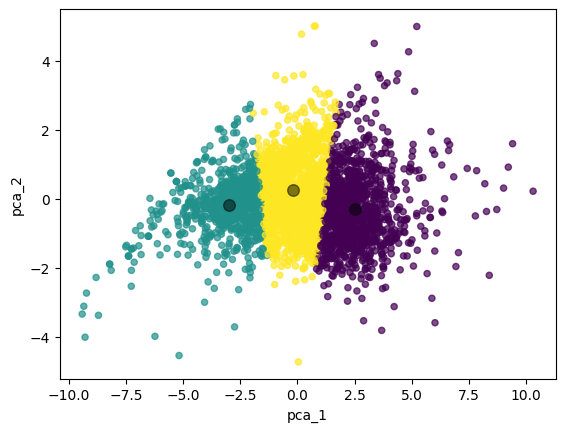

In [27]:
plt.scatter(*pca_customer_profile.T, c=clusters_customers, s=20, alpha=0.7)
plt.xlabel('pca_1')
plt.ylabel('pca_2')
# select cluster centers
centroids = kmeans.cluster_centers_
plt.scatter(*centroids.T, c='black', s=70, alpha=0.5);

plt.savefig('tex/img/clustering/km_clusters.png')

In [28]:
pd.DataFrame(pd.Series(clusters_customers).value_counts(), columns=['CustomersNb']).T.sort_index(axis=1)

,0,1,2
CustomersNb,1247,929,2029


For comparison, if we run the K-Means algorithm without the PCA step, the result would be the following:

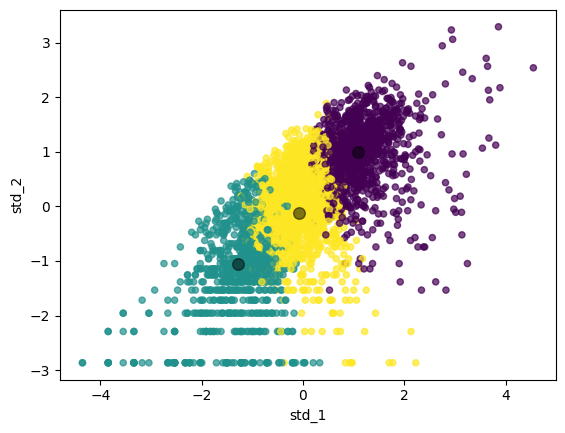

In [29]:
plt.scatter(std_customer_profile[:, 0], std_customer_profile[:, 1], c=clusters_customers, s=20, alpha=0.7)
plt.xlabel('std_1')
plt.ylabel('std_2')
# select cluster centers
centroids = pca.inverse_transform(kmeans.cluster_centers_)
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=70, alpha=0.5);

In [30]:
customer_profile_kmeans = customer_profile.copy(deep=True)
customer_profile_kmeans['cluster'] = clusters_customers
customer_profile_kmeans['cluster'] = customer_profile_kmeans['cluster'].map({0: 'high', 1: 'low', 2: 'medium'}) # check clusters-labels mapping for each run!
customer_profile_kmeans

,I,Iu,Imax,E,Savg,F,M,cluster
CustomerID,,,,,,,,
12347.0,3.330211,1.939519,2.829947,4.239118,2.777935,0.778151,3.556087,high
12348.0,3.035029,0.954243,2.778151,2.550341,2.417438,0.477121,2.894560,medium
12349.0,2.799341,1.857332,2.799341,3.903268,3.163623,0.000000,3.163623,high
12350.0,2.292256,1.204120,2.292256,2.500000,2.468938,0.000000,2.468938,medium
12352.0,2.665581,1.755875,2.096910,3.158366,2.324080,0.778151,3.102231,medium
...,...,...,...,...,...,...,...,...
18280.0,1.653213,1.000000,1.653213,1.846439,2.256718,0.000000,2.256718,low
18281.0,1.732394,0.845098,1.732394,1.842371,1.907519,0.000000,1.907519,low
18282.0,1.991226,1.079181,1.845098,3.022055,1.945961,0.301030,2.246991,low


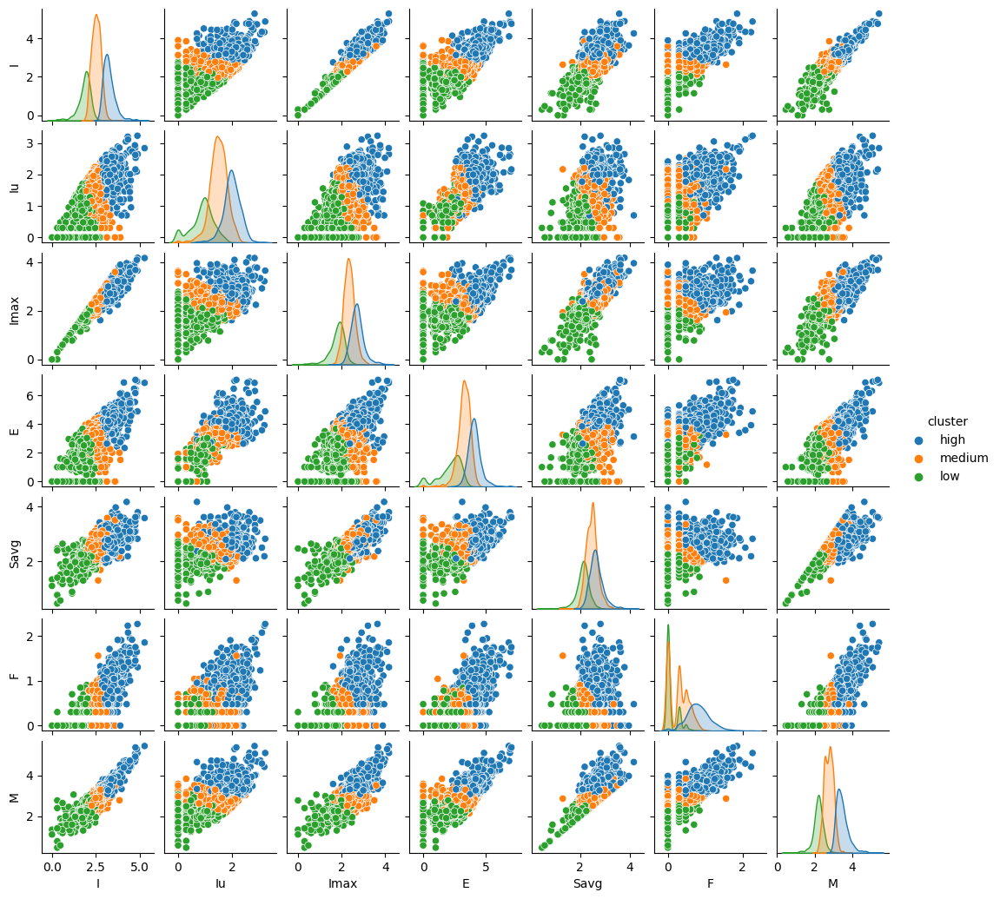

In [31]:
sns.pairplot(customer_profile_kmeans, hue='cluster', diag_kind='kde', height=1.5);

plt.savefig('tex/img/clustering/pair_plot_clust.png')

In [32]:
customer_profile_kmeans.to_csv('dataset/customer_profile_kmeans.csv', sep='\t')

## Fuzzy C-Means

In [33]:
from fcmeans import FCM

In [34]:
fcmeans = FCM(n_clusters=3)
fcmeans.fit(pca_customer_profile)
clusters_customers = fcmeans.u.argmax(axis=1)

Cluster 0 avg silhouette: 0.36932482313693943
Cluster 1 avg silhouette: 0.35894404804975544
Cluster 2 avg silhouette: 0.3754188628643352
Total avg silhouette: 0.3677896137609174


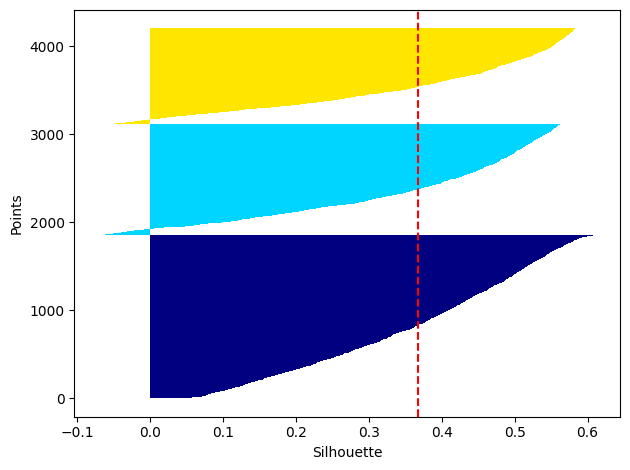

In [35]:
plot_silhouette_score(pca_customer_profile, clusters_customers)

plt.savefig('tex/img/clustering/sil_fcmeans.png')

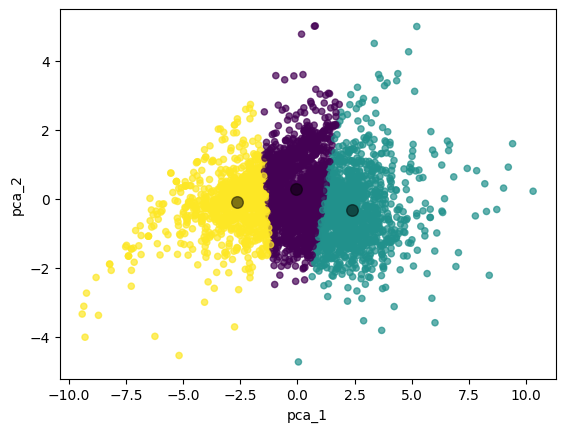

In [36]:
plt.scatter(*pca_customer_profile.T, c=clusters_customers, s=20, alpha=0.7)
plt.xlabel('pca_1')
plt.ylabel('pca_2')
# select cluster centers
centroids = fcmeans.centers
plt.scatter(*centroids.T, c='black', s=70, alpha=0.5);

plt.savefig('tex/img/clustering/clust_fcmeans.png')

In [37]:
pd.DataFrame(pd.Series(clusters_customers).value_counts(), columns=['CustomersNb']).T.sort_index(axis=1)

,0,1,2
CustomersNb,1858,1260,1087


For comparison, if we run the K-Means algorithm without the PCA step, the result would be the following:

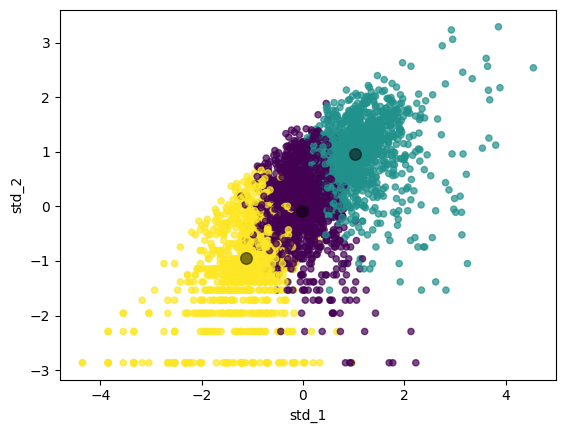

In [38]:
plt.scatter(std_customer_profile[:, 0], std_customer_profile[:, 1], c=clusters_customers, s=20, alpha=0.7)
plt.xlabel('std_1')
plt.ylabel('std_2')
# select cluster centers
centroids = pca.inverse_transform(fcmeans.centers)
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=70, alpha=0.5);

In [39]:
customer_profile_fcmeans = customer_profile.copy(deep=True)
customer_profile_fcmeans['cluster'] = clusters_customers
customer_profile_fcmeans['cluster'] = customer_profile_fcmeans['cluster'].map({0: 'low', 1: 'medium', 2: 'high'}) # check clusters-labels mapping for each run!
customer_profile_fcmeans

,I,Iu,Imax,E,Savg,F,M,cluster
CustomerID,,,,,,,,
12347.0,3.330211,1.939519,2.829947,4.239118,2.777935,0.778151,3.556087,medium
12348.0,3.035029,0.954243,2.778151,2.550341,2.417438,0.477121,2.894560,low
12349.0,2.799341,1.857332,2.799341,3.903268,3.163623,0.000000,3.163623,low
12350.0,2.292256,1.204120,2.292256,2.500000,2.468938,0.000000,2.468938,low
12352.0,2.665581,1.755875,2.096910,3.158366,2.324080,0.778151,3.102231,low
...,...,...,...,...,...,...,...,...
18280.0,1.653213,1.000000,1.653213,1.846439,2.256718,0.000000,2.256718,high
18281.0,1.732394,0.845098,1.732394,1.842371,1.907519,0.000000,1.907519,high
18282.0,1.991226,1.079181,1.845098,3.022055,1.945961,0.301030,2.246991,high


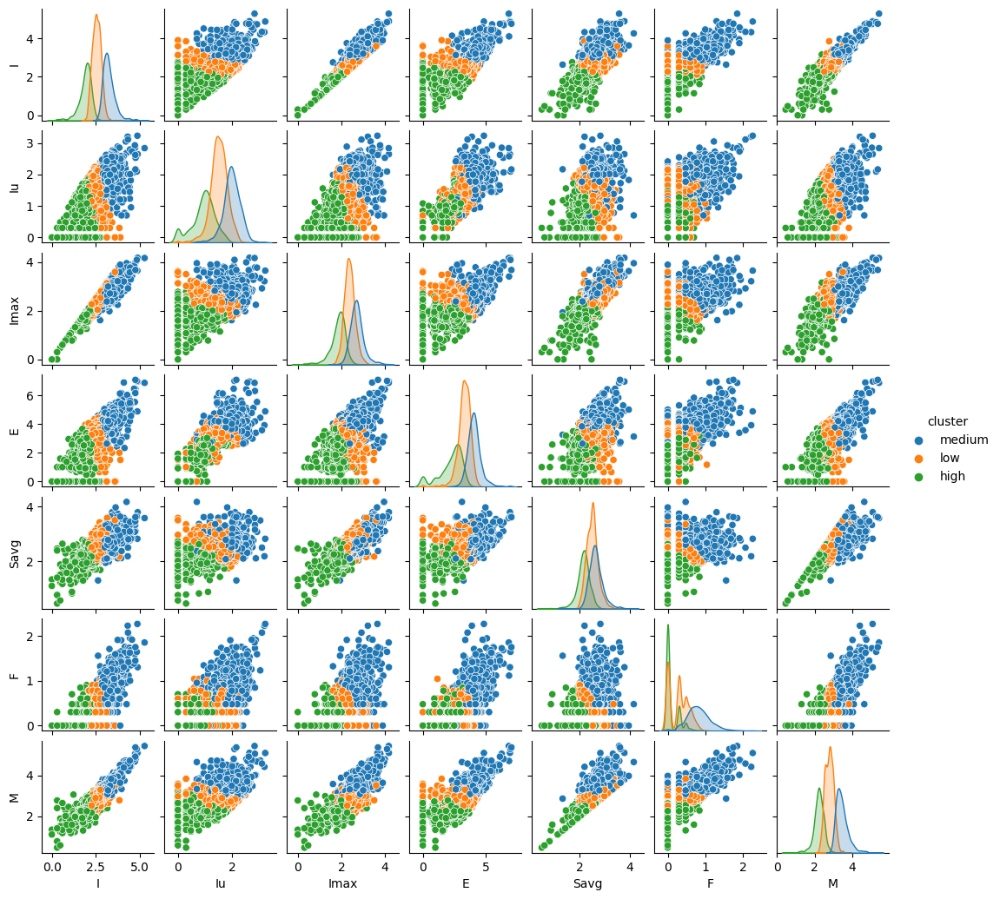

In [40]:
sns.pairplot(customer_profile_fcmeans, hue='cluster', diag_kind='kde', height=1.5);

plt.savefig('tex/img/clustering/pairplot_fcmeans.png')

In [41]:
customer_profile_fcmeans.to_csv('dataset/customer_profile_fcmeans.csv', sep='\t')

## DBSCAN

We must provide a value for *eps* which defines the maximum distance between two points. Layman [[1]](https://iopscience.iop.org/article/10.1088/1755-1315/31/1/012012/pdf) describes an approach for automatically determining the optimal value for *eps*.


In Layman’s terms, we find a suitable value for epsilon by calculating the distance to the nearest n points for each point, sorting and plotting the results. Then we look to see where the change is most pronounced (think of the angle between your arm and forearm) and select that as *esp*.


We can calculate the distance from each point to its closest neighbour using the k-nearest neighbors. The point itself is included in *n_neighbors*. The k-nn method returns two arrays, one which contains the distance to the closest *n_neighbors* points and the other which contains the index for each of those points. The optimal value for *eps* will be found at the point of maximum curvature.

In [42]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

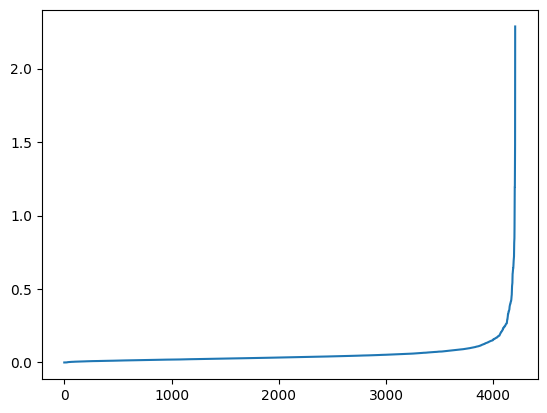

In [44]:
knn = NearestNeighbors(n_neighbors=20)
nbrs = knn.fit(pca_customer_profile)
distances, indices = nbrs.kneighbors(pca_customer_profile)
distances = np.sort(distances, axis=0)[:, 1]
plt.plot(distances);

plt.savefig('tex/img/clustering/db_scan_distance.png')

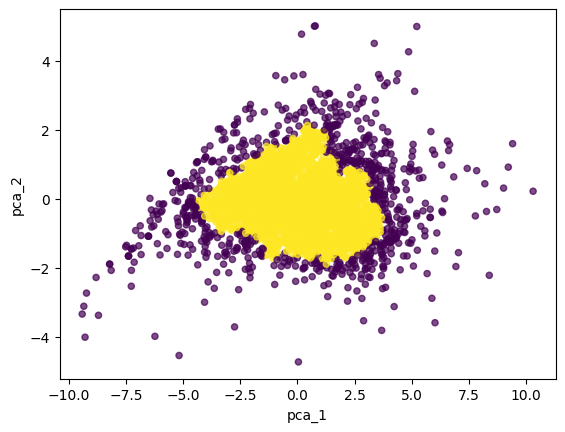

In [45]:
dbscan = DBSCAN(eps=0.25, min_samples=20)
clusters_customers = dbscan.fit_predict(pca_customer_profile)
plt.xlabel('pca_1')
plt.ylabel('pca_2')
plt.scatter(*pca_customer_profile.T, c=clusters_customers, s=20, alpha=0.7);

plt.savefig('tex/img/clustering/dbscan.png')

In [46]:
pd.DataFrame(pd.Series(clusters_customers).value_counts(), columns=['CustomersNb']).T.sort_index(axis=1)

,-1,0
CustomersNb,747,3458


For comparison, if we run the DBSCAN algorithm without the PCA step, the result would be the following:

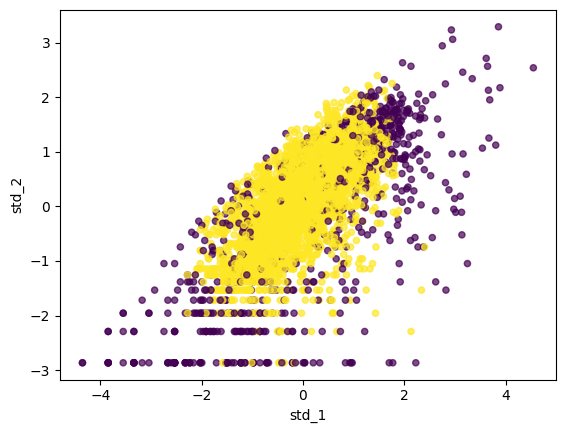

In [47]:
plt.xlabel('std_1')
plt.ylabel('std_2')
plt.scatter(std_customer_profile[:, 0], std_customer_profile[:, 1], c=clusters_customers, s=20, alpha=0.7);

In [48]:
customer_profile_dbscan = customer_profile.copy(deep=True)
customer_profile_dbscan['cluster'] = clusters_customers
customer_profile_dbscan['cluster'] = customer_profile_dbscan['cluster']
customer_profile_dbscan

,I,Iu,Imax,E,Savg,F,M,cluster
CustomerID,,,,,,,,
12347.0,3.330211,1.939519,2.829947,4.239118,2.777935,0.778151,3.556087,0
12348.0,3.035029,0.954243,2.778151,2.550341,2.417438,0.477121,2.894560,0
12349.0,2.799341,1.857332,2.799341,3.903268,3.163623,0.000000,3.163623,-1
12350.0,2.292256,1.204120,2.292256,2.500000,2.468938,0.000000,2.468938,0
12352.0,2.665581,1.755875,2.096910,3.158366,2.324080,0.778151,3.102231,0
...,...,...,...,...,...,...,...,...
18280.0,1.653213,1.000000,1.653213,1.846439,2.256718,0.000000,2.256718,0
18281.0,1.732394,0.845098,1.732394,1.842371,1.907519,0.000000,1.907519,0
18282.0,1.991226,1.079181,1.845098,3.022055,1.945961,0.301030,2.246991,0


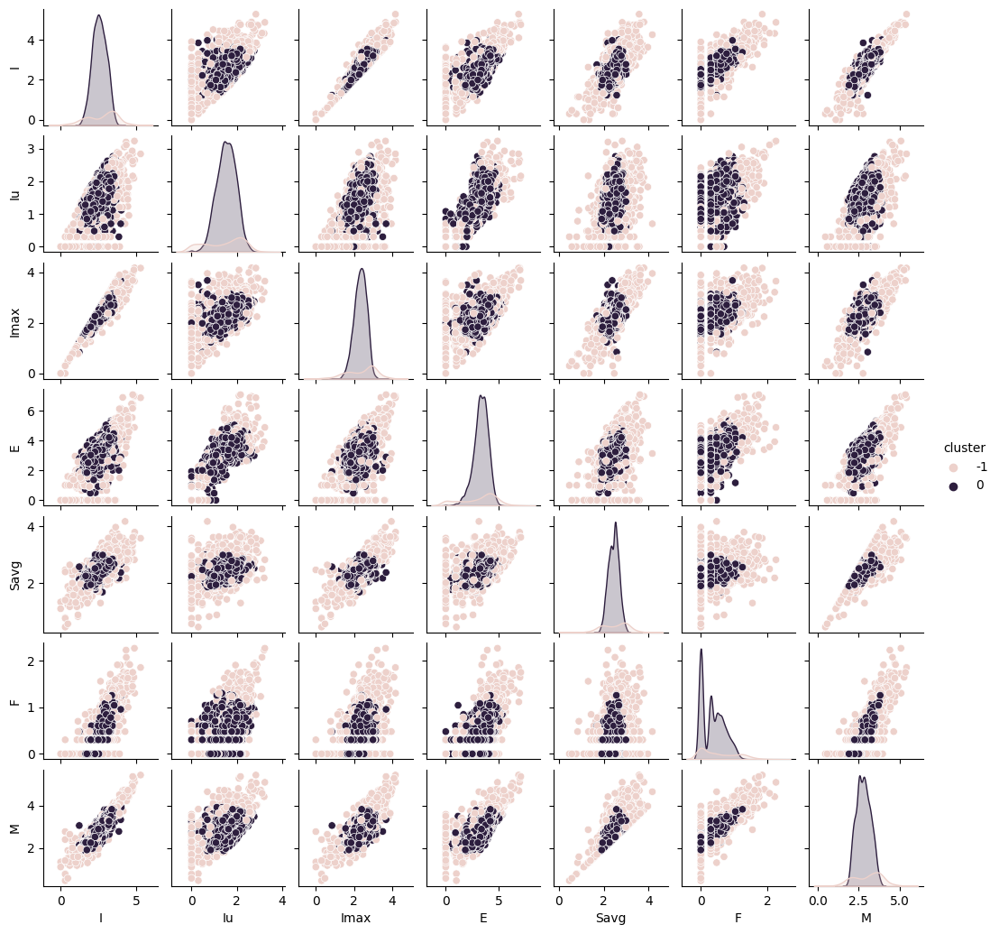

In [49]:
sns.pairplot(customer_profile_dbscan, hue='cluster', diag_kind='kde', height=1.5);

## Agglomerative Clustering

In [50]:
from sklearn.cluster import AgglomerativeClustering

In [51]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    # create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)

    # plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

The linkage criterion determines which distance to use between sets of observation. The algorithm will merge the pairs of cluster that minimize this criterion:

- *Ward* minimizes the euclidean distance of the clusters being merged (is the hierarchical analogue of K-means, so it can be used to initialize it)
    - strength: less susceptible to noise and outliers
    - limitations: biased towards globular clusters
- *single* or *maximum linkage* uses the minimum of the distances between all observations of the two sets
    - strength: can handle non-elliptical shapes
    - limitations: sensitive to noise and outliers
- *complete* or *maximum linkage* uses the maximum distances between all observations of the two sets
    - strength: less susceptible to noise and outliers
    - limitations: tends to break large clusters, biased towards globular clusters
- *average* linkage is a compromise between *single* and *complete* linkage by using the average of the distances of each observation of the two sets
    - strength: less susceptible to noise and outliers
    - limitations: biased towards globular clusters

### Ward Linkage

In [52]:
ward = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage='ward')  # setting distance_threshold=0 ensures we compute the full tree
clusters_customers = ward.fit_predict(pca_customer_profile)

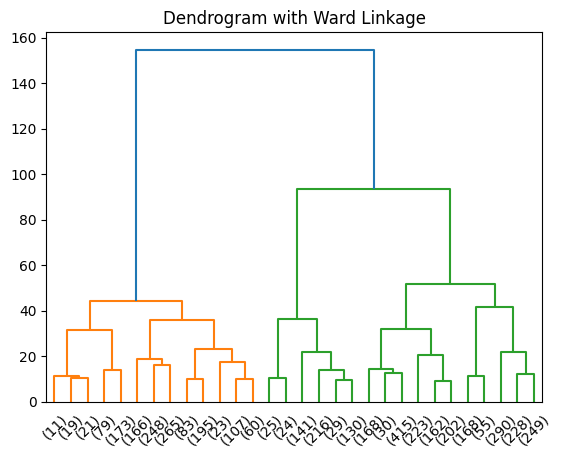

In [53]:
plt.title('Dendrogram with Ward Linkage')
plot_dendrogram(ward, truncate_mode='lastp')  # plot the last p non-singleton clusters formed in the linkage

plt.savefig('tex/img/clustering/ward_link.png')

Cut the dendogram in order to have two clusters:

In [54]:
ward = AgglomerativeClustering(distance_threshold=None, n_clusters=2, linkage='ward')
clusters_customers = ward.fit_predict(pca_customer_profile)

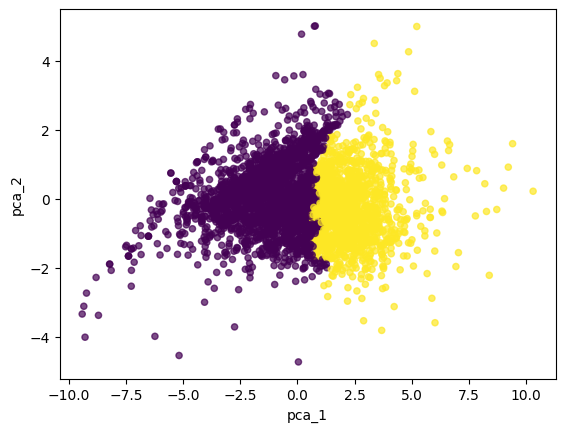

In [55]:
plt.xlabel('pca_1')
plt.ylabel('pca_2')
plt.scatter(*pca_customer_profile.T, c=clusters_customers, s=20, alpha=0.7);

In [56]:
pd.DataFrame(pd.Series(clusters_customers).value_counts(), columns=['CustomersNb']).T.sort_index(axis=1)

,0,1
CustomersNb,2755,1450


For comparison, if we run the agglomerative clustering algorithm with the Ward linkage without the PCA step, the result would be the following:

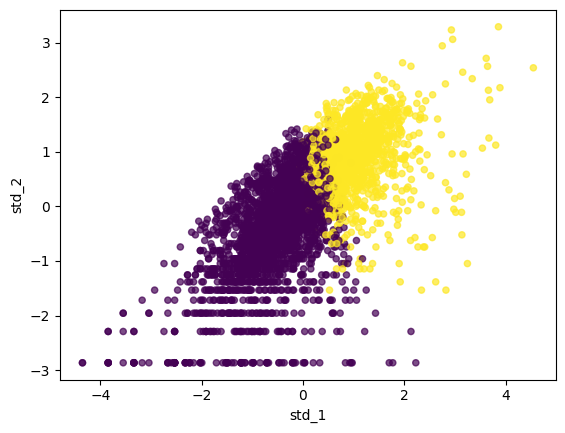

In [57]:
plt.xlabel('std_1')
plt.ylabel('std_2')
plt.scatter(std_customer_profile[:, 0], std_customer_profile[:, 1], c=clusters_customers, s=20, alpha=0.7);

In [58]:
customer_profile_ward = customer_profile.copy(deep=True)
customer_profile_ward['cluster'] = clusters_customers
customer_profile_ward['cluster'] = customer_profile_ward['cluster']
customer_profile_ward

,I,Iu,Imax,E,Savg,F,M,cluster
CustomerID,,,,,,,,
12347.0,3.330211,1.939519,2.829947,4.239118,2.777935,0.778151,3.556087,1
12348.0,3.035029,0.954243,2.778151,2.550341,2.417438,0.477121,2.894560,0
12349.0,2.799341,1.857332,2.799341,3.903268,3.163623,0.000000,3.163623,0
12350.0,2.292256,1.204120,2.292256,2.500000,2.468938,0.000000,2.468938,0
12352.0,2.665581,1.755875,2.096910,3.158366,2.324080,0.778151,3.102231,0
...,...,...,...,...,...,...,...,...
18280.0,1.653213,1.000000,1.653213,1.846439,2.256718,0.000000,2.256718,0
18281.0,1.732394,0.845098,1.732394,1.842371,1.907519,0.000000,1.907519,0
18282.0,1.991226,1.079181,1.845098,3.022055,1.945961,0.301030,2.246991,0


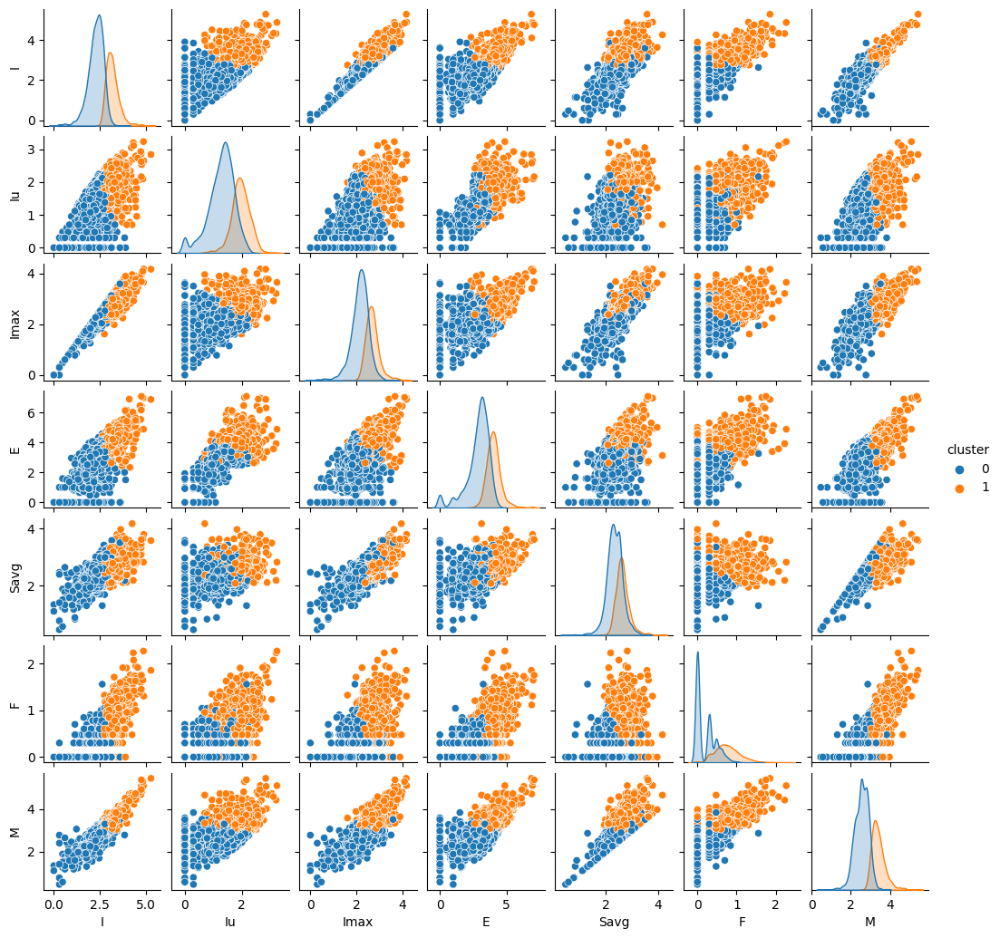

In [59]:
sns.pairplot(customer_profile_ward, hue='cluster', diag_kind='kde', height=1.5);

### Single Linkage

In [60]:
single = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage='single')  # setting distance_threshold=0 ensures we compute the full tree
clusters_customers = single.fit_predict(pca_customer_profile)

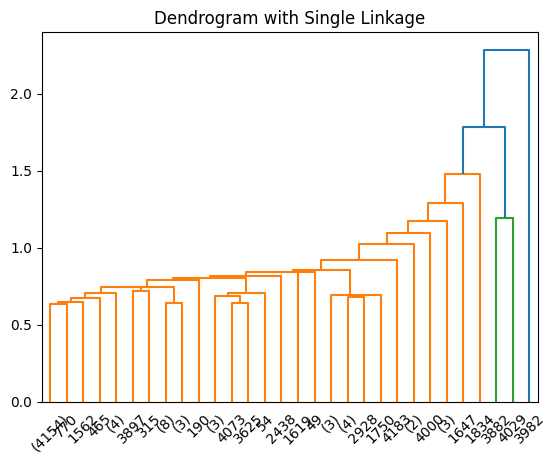

In [61]:
plt.title('Dendrogram with Single Linkage')
plot_dendrogram(single, truncate_mode='lastp')  # plot the last p non-singleton clusters formed in the linkage

plt.savefig('tex/img/clustering/single_link.png')

Cut the dendogram in order to have two clusters:

In [62]:
single = AgglomerativeClustering(distance_threshold=None, n_clusters=2, linkage='single')
clusters_customers = single.fit_predict(pca_customer_profile)

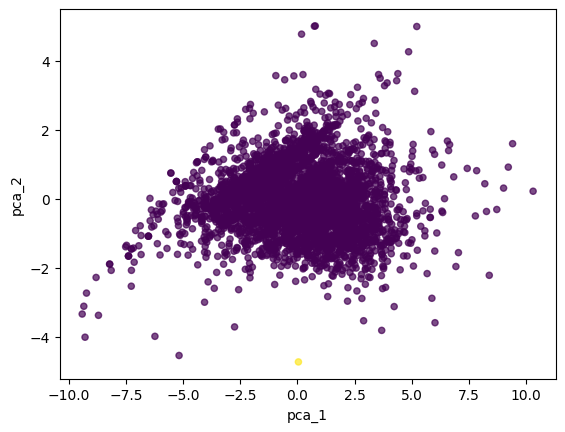

In [63]:
plt.xlabel('pca_1')
plt.ylabel('pca_2')
plt.scatter(*pca_customer_profile.T, c=clusters_customers, s=20, alpha=0.7);

In [64]:
pd.DataFrame(pd.Series(clusters_customers).value_counts(), columns=['CustomersNb']).T.sort_index(axis=1)

,0,1
CustomersNb,4204,1


For comparison, if we run the agglomerative clustering algorithm with the single linkage without the PCA step, the result would be the following:

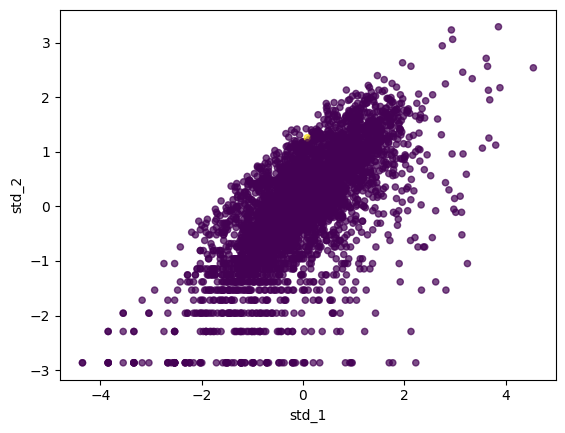

In [65]:
plt.xlabel('std_1')
plt.ylabel('std_2')
plt.scatter(std_customer_profile[:, 0], std_customer_profile[:, 1], c=clusters_customers, s=20, alpha=0.7);

In [66]:
customer_profile_single = customer_profile.copy(deep=True)
customer_profile_single['cluster'] = clusters_customers
customer_profile_single['cluster'] = customer_profile_single['cluster']
customer_profile_single

,I,Iu,Imax,E,Savg,F,M,cluster
CustomerID,,,,,,,,
12347.0,3.330211,1.939519,2.829947,4.239118,2.777935,0.778151,3.556087,0
12348.0,3.035029,0.954243,2.778151,2.550341,2.417438,0.477121,2.894560,0
12349.0,2.799341,1.857332,2.799341,3.903268,3.163623,0.000000,3.163623,0
12350.0,2.292256,1.204120,2.292256,2.500000,2.468938,0.000000,2.468938,0
12352.0,2.665581,1.755875,2.096910,3.158366,2.324080,0.778151,3.102231,0
...,...,...,...,...,...,...,...,...
18280.0,1.653213,1.000000,1.653213,1.846439,2.256718,0.000000,2.256718,0
18281.0,1.732394,0.845098,1.732394,1.842371,1.907519,0.000000,1.907519,0
18282.0,1.991226,1.079181,1.845098,3.022055,1.945961,0.301030,2.246991,0


### Complete Linkage

In [67]:
complete = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage='complete')  # setting distance_threshold=0 ensures we compute the full tree
clusters_customers = complete.fit_predict(pca_customer_profile)

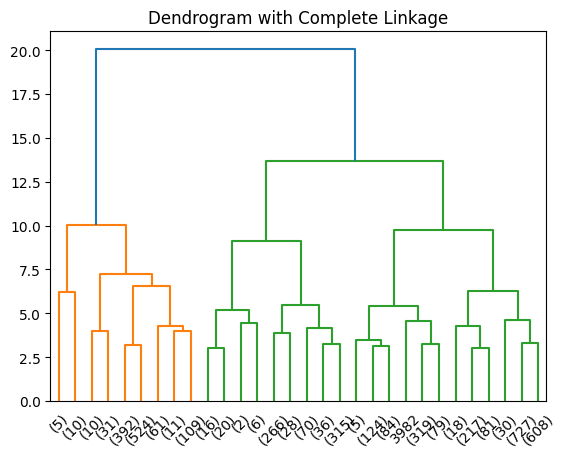

In [68]:
plt.title('Dendrogram with Complete Linkage')
plot_dendrogram(complete, truncate_mode='lastp')  # plot the last p non-singleton clusters formed in the linkage

plt.savefig('tex/img/clustering/complete_link.png')

Cut the dendogram in order to have two clusters:

In [69]:
complete = AgglomerativeClustering(distance_threshold=None, n_clusters=2, linkage='complete')
clusters_customers = complete.fit_predict(pca_customer_profile)

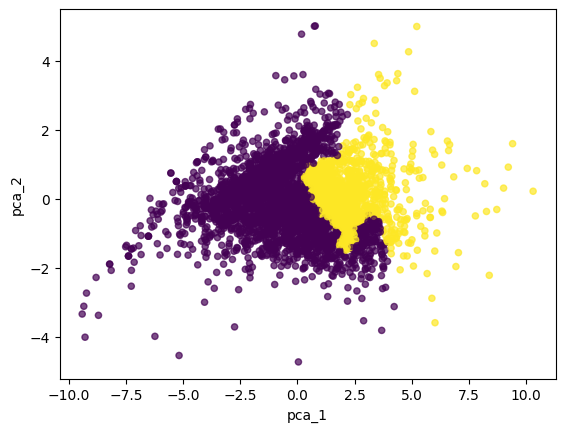

In [70]:
plt.xlabel('pca_1')
plt.ylabel('pca_2')
plt.scatter(*pca_customer_profile.T, c=clusters_customers, s=20, alpha=0.7);

In [71]:
pd.DataFrame(pd.Series(clusters_customers).value_counts(), columns=['CustomersNb']).T.sort_index(axis=1)

,0,1
CustomersNb,3052,1153


For comparison, if we run the agglomerative clustering algorithm with the complete linkage without the PCA step, the result would be the following:

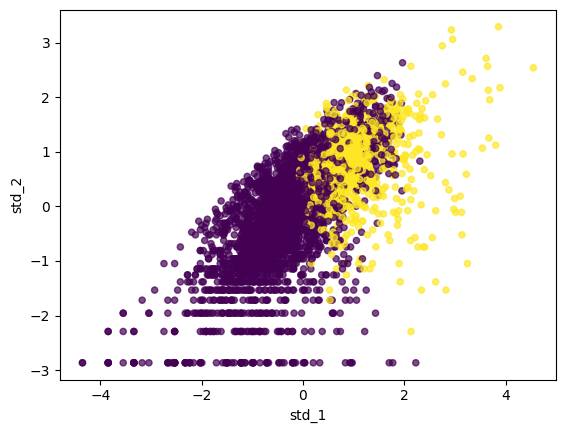

In [72]:
plt.xlabel('std_1')
plt.ylabel('std_2')
plt.scatter(std_customer_profile[:, 0], std_customer_profile[:, 1], c=clusters_customers, s=20, alpha=0.7);

In [73]:
customer_profile_complete = customer_profile.copy(deep=True)
customer_profile_complete['cluster'] = clusters_customers
customer_profile_complete['cluster'] = customer_profile_complete['cluster']
customer_profile_complete

,I,Iu,Imax,E,Savg,F,M,cluster
CustomerID,,,,,,,,
12347.0,3.330211,1.939519,2.829947,4.239118,2.777935,0.778151,3.556087,1
12348.0,3.035029,0.954243,2.778151,2.550341,2.417438,0.477121,2.894560,0
12349.0,2.799341,1.857332,2.799341,3.903268,3.163623,0.000000,3.163623,0
12350.0,2.292256,1.204120,2.292256,2.500000,2.468938,0.000000,2.468938,0
12352.0,2.665581,1.755875,2.096910,3.158366,2.324080,0.778151,3.102231,0
...,...,...,...,...,...,...,...,...
18280.0,1.653213,1.000000,1.653213,1.846439,2.256718,0.000000,2.256718,0
18281.0,1.732394,0.845098,1.732394,1.842371,1.907519,0.000000,1.907519,0
18282.0,1.991226,1.079181,1.845098,3.022055,1.945961,0.301030,2.246991,0


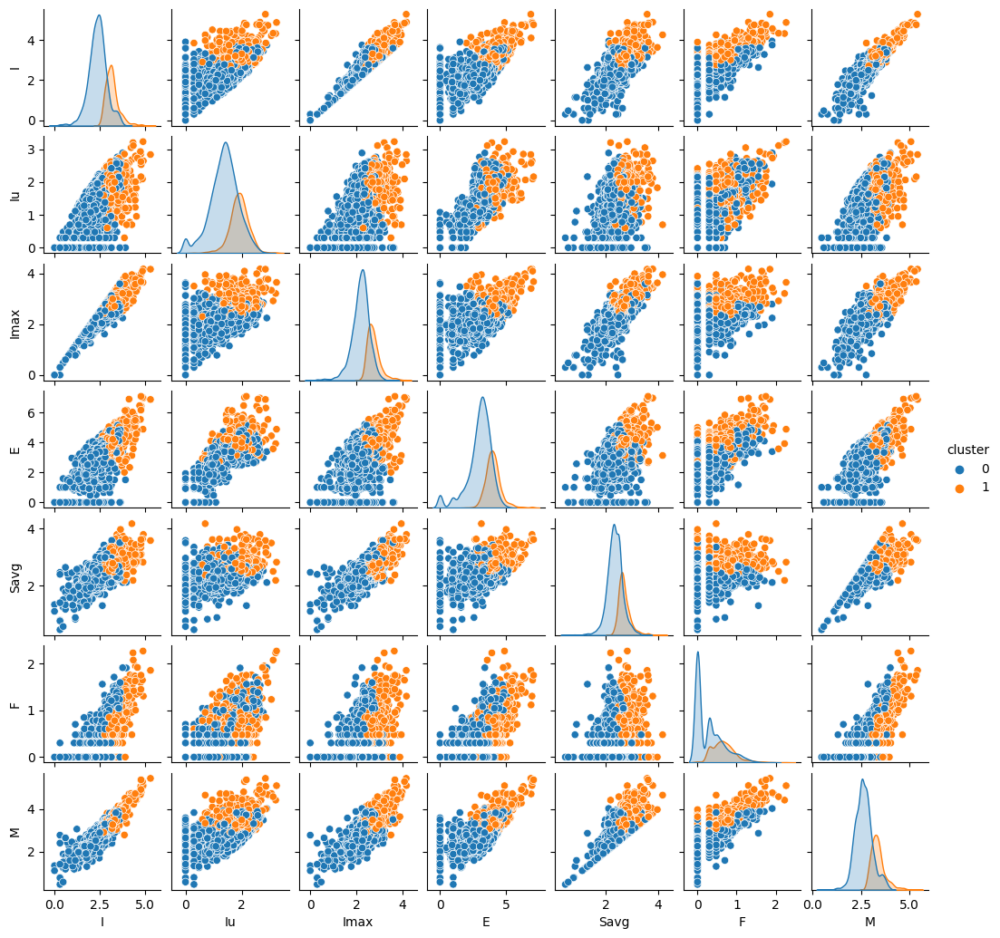

In [74]:
sns.pairplot(customer_profile_complete, hue='cluster', diag_kind='kde', height=1.5);

### Average Linkage

In [75]:
avg = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage='average')  # setting distance_threshold=0 ensures we compute the full tree
clusters_customers = avg.fit_predict(pca_customer_profile)

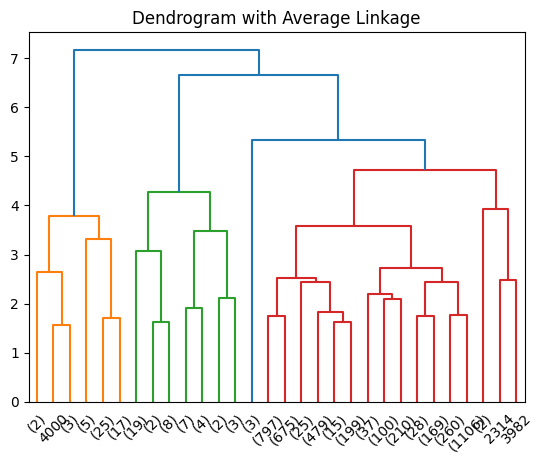

In [76]:
plt.title('Dendrogram with Average Linkage')
plot_dendrogram(avg, truncate_mode='lastp')  # plot the last p non-singleton clusters formed in the linkage

plt.savefig('tex/img/clustering/avg_link.png')

Cut the dendogram in order to have three clusters:

In [77]:
avg = AgglomerativeClustering(distance_threshold=None, n_clusters=3, linkage='average')
clusters_customers = avg.fit_predict(pca_customer_profile)

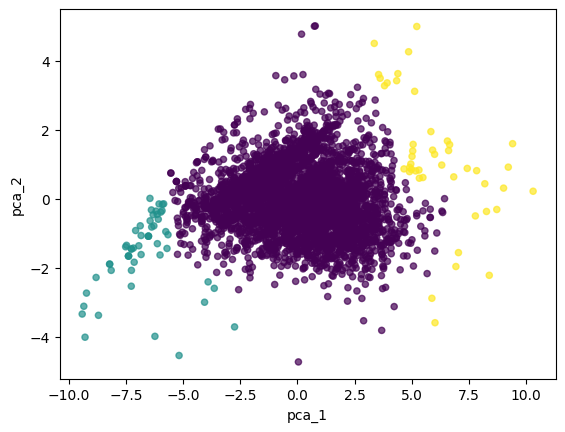

In [78]:
plt.xlabel('pca_1')
plt.ylabel('pca_2')
plt.scatter(*pca_customer_profile.T, c=clusters_customers, s=20, alpha=0.7);

In [79]:
pd.DataFrame(pd.Series(clusters_customers).value_counts(), columns=['CustomersNb']).T.sort_index(axis=1)

,0,1,2
CustomersNb,4107,53,45


For comparison, if we run the agglomerative clustering algorithm with the average linkage without the PCA step, the result would be the following:

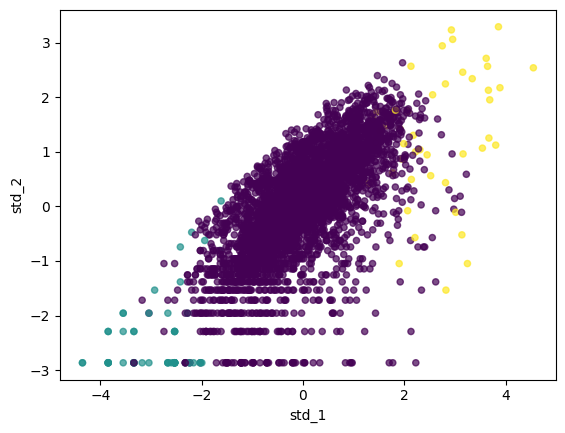

In [80]:
plt.xlabel('std_1')
plt.ylabel('std_2')
plt.scatter(std_customer_profile[:, 0], std_customer_profile[:, 1], c=clusters_customers, s=20, alpha=0.7);

In [81]:
customer_profile_avg = customer_profile.copy(deep=True)
customer_profile_avg['cluster'] = clusters_customers
customer_profile_avg['cluster'] = customer_profile_avg['cluster']
customer_profile_avg

,I,Iu,Imax,E,Savg,F,M,cluster
CustomerID,,,,,,,,
12347.0,3.330211,1.939519,2.829947,4.239118,2.777935,0.778151,3.556087,0
12348.0,3.035029,0.954243,2.778151,2.550341,2.417438,0.477121,2.894560,0
12349.0,2.799341,1.857332,2.799341,3.903268,3.163623,0.000000,3.163623,0
12350.0,2.292256,1.204120,2.292256,2.500000,2.468938,0.000000,2.468938,0
12352.0,2.665581,1.755875,2.096910,3.158366,2.324080,0.778151,3.102231,0
...,...,...,...,...,...,...,...,...
18280.0,1.653213,1.000000,1.653213,1.846439,2.256718,0.000000,2.256718,0
18281.0,1.732394,0.845098,1.732394,1.842371,1.907519,0.000000,1.907519,0
18282.0,1.991226,1.079181,1.845098,3.022055,1.945961,0.301030,2.246991,0


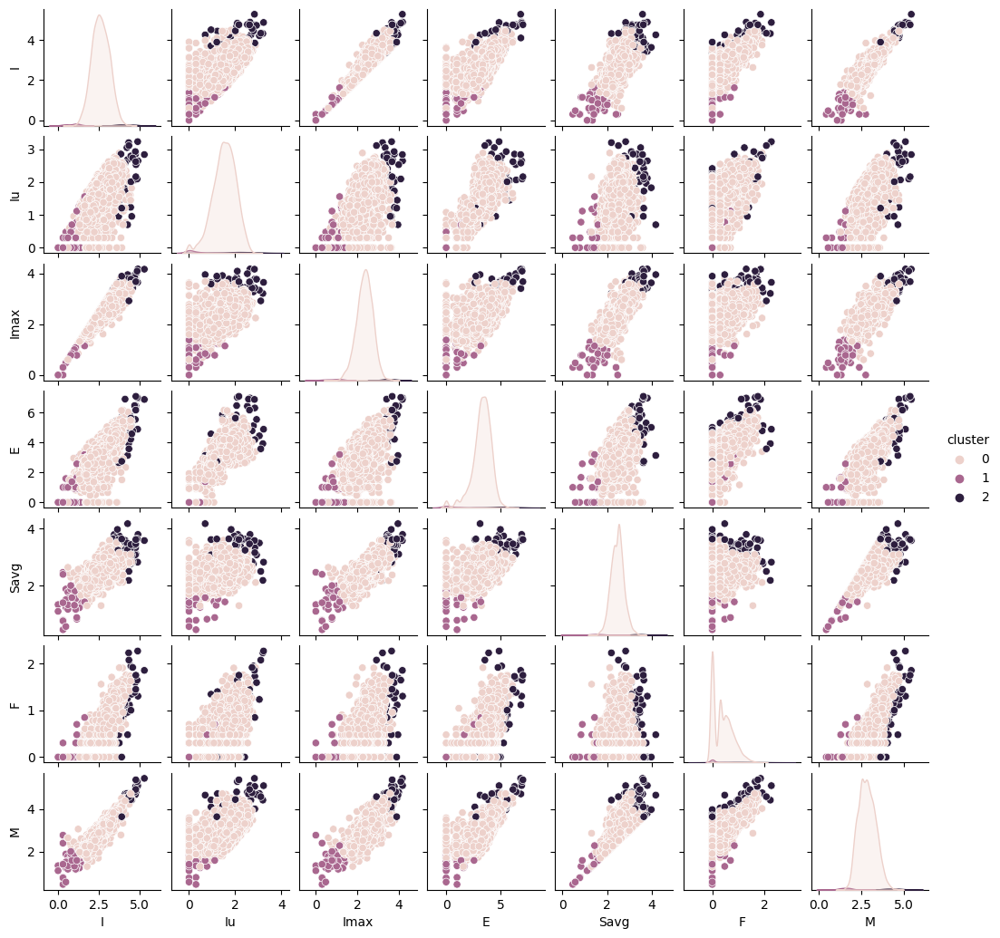

In [82]:
sns.pairplot(customer_profile_avg, hue='cluster', diag_kind='kde', height=1.5);

## Birch

In [83]:
from sklearn.cluster import Birch

In [84]:
birch = Birch(n_clusters=3)
clusters_customers = birch.fit_predict(pca_customer_profile)

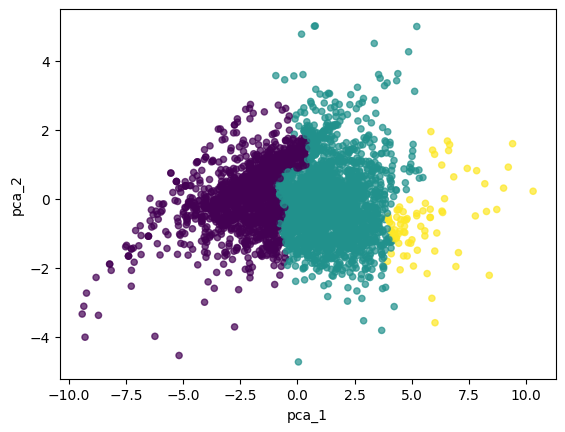

In [85]:
plt.xlabel('pca_1')
plt.ylabel('pca_2')
plt.scatter(*pca_customer_profile.T, c=clusters_customers, s=20, alpha=0.7);

plt.savefig('tex/img/clustering/clust_birch.png')

In [86]:
pd.DataFrame(pd.Series(clusters_customers).value_counts(), columns=['CustomersNb']).T.sort_index(axis=1)

,0,1,2
CustomersNb,1783,2343,79


For comparison, if we run the agglomerative clustering algorithm with the single linkage without the PCA step, the result would be the following:

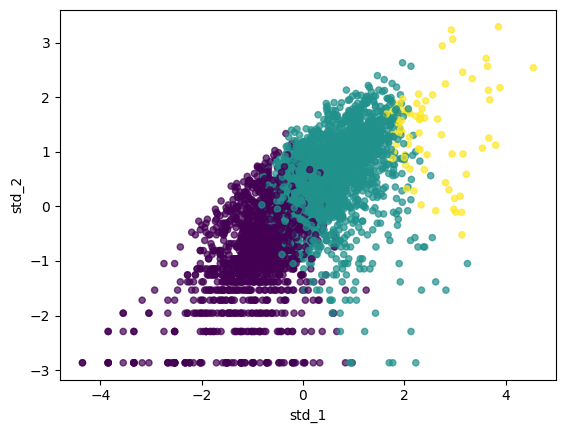

In [87]:
plt.xlabel('std_1')
plt.ylabel('std_2')
plt.scatter(std_customer_profile[:, 0], std_customer_profile[:, 1], c=clusters_customers, s=20, alpha=0.7);

In [88]:
customer_profile_birch = customer_profile.copy(deep=True)
customer_profile_birch['cluster'] = clusters_customers
customer_profile_birch['cluster'] = customer_profile_birch['cluster'].map({0: 'high', 1: 'medium', 2: 'low'}) # check clusters-labels mapping for each run!
customer_profile_birch

,I,Iu,Imax,E,Savg,F,M,cluster
CustomerID,,,,,,,,
12347.0,3.330211,1.939519,2.829947,4.239118,2.777935,0.778151,3.556087,medium
12348.0,3.035029,0.954243,2.778151,2.550341,2.417438,0.477121,2.894560,medium
12349.0,2.799341,1.857332,2.799341,3.903268,3.163623,0.000000,3.163623,medium
12350.0,2.292256,1.204120,2.292256,2.500000,2.468938,0.000000,2.468938,high
12352.0,2.665581,1.755875,2.096910,3.158366,2.324080,0.778151,3.102231,medium
...,...,...,...,...,...,...,...,...
18280.0,1.653213,1.000000,1.653213,1.846439,2.256718,0.000000,2.256718,high
18281.0,1.732394,0.845098,1.732394,1.842371,1.907519,0.000000,1.907519,high
18282.0,1.991226,1.079181,1.845098,3.022055,1.945961,0.301030,2.246991,high


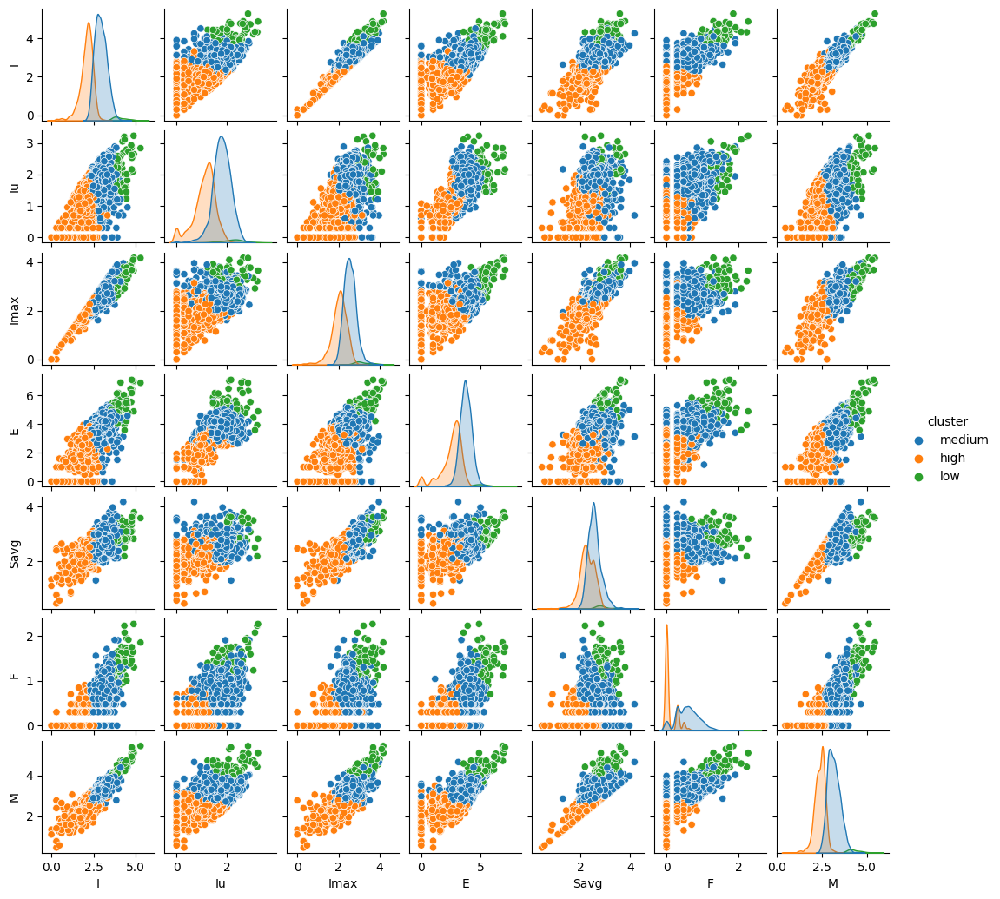

In [89]:
sns.pairplot(customer_profile_birch, hue='cluster', diag_kind='kde', height=1.5);

plt.savefig('tex/img/clustering/pairplot_birch.png')

In [90]:
customer_profile_birch.to_csv('dataset/customer_profile_birch.csv', sep='\t')